# MODELOS DE BENCHMARK

In [2]:
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.io as pio
import plotly.express as px
import plotly.offline as py
pio.renderers.default = "notebook"

import seaborn as sns
import matplotlib.dates as mdates
import mplfinance as mpf
from sklearn.model_selection import train_test_split

from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
import math
from sklearn.model_selection import GridSearchCV
from keras.wrappers.scikit_learn import KerasRegressor

##  Preparación de datos 
para el modelamiento de la series se escogerá el precio de serie de la acción. También Se asignará la fecha como eje x. Así mismo se hará la división dde los datos entre entrenamiento y prueba 

In [3]:
data = pd.read_csv(r"C:\Users\claud\OneDrive - Universidad del Norte\Escritorio\Series de tiempo\Natural_Gas_data.csv")


In [4]:
data['date'] = pd.to_datetime(data['date'])  
data.set_index('date', inplace=True)
data_index = data.index

In [5]:

y = data['close'].values

# Primero, dividimos en train + val y test (85% para train + val, 15% para test)
y_train_val, y_test = train_test_split(y, test_size=0.15, shuffle=False)

# Luego, dividimos el train + val en train (70%) y val (30% de ese subconjunto)
y_train, y_val = train_test_split(y_train_val, test_size=0.3, shuffle=False)

# Verificando las formas de los conjuntos
print(f'Tamaño de entrenamiento: {len(y_train)}')
print(f'Tamaño de validación: {len(y_val)}')
print(f'Tamaño de prueba: {len(y_test)}')

Tamaño de entrenamiento: 3558
Tamaño de validación: 1525
Tamaño de prueba: 897


Dividimos los datos en entrenamiento, validación y test

In [6]:

metrics_list = []

Se realizó una función para graficar los modelos

In [7]:
import numpy as np
import pandas as pd
import plotly.express as px


def plot_model_results_plotly(y_train, y_train_pred, y_val, y_val_pred, y_test, y_pred, data_index, train_size, val_size, title):
    # Crear un índice completo basado en la longitud total de los datos
    data_index_full = data_index[:len(y_train) + len(y_val) + len(y_test)]
    
    # Extender las listas para alinear los datos con el índice completo
    y_train_extended = np.concatenate([y_train, [None] * (len(y_val) + len(y_test))])
    y_train_pred_full = np.concatenate([y_train_pred, [None] * (len(y_train_extended) - len(y_train_pred))])
    
    y_val_extended = np.concatenate([[None] * len(y_train), y_val, [None] * len(y_test)])
    y_val_pred_full = np.concatenate([[None] * len(y_train), y_val_pred, [None] * (len(y_test))])
    
    y_test_extended = np.concatenate([[None] * (len(y_train) + len(y_val)), y_test])
    y_pred_full = np.concatenate([[None] * (len(y_train) + len(y_val)), y_pred])

    # Crear DataFrame para la gráfica
    df_plot = pd.DataFrame({
        'Fecha': data_index_full,
        'Datos de entrenamiento': y_train_extended,
        'Modelo entrenado': y_train_pred_full,
        'Datos de validación': y_val_extended,
        'Predicción validación': y_val_pred_full,
        'Datos de prueba': y_test_extended,
        'Predicción prueba': y_pred_full
    })

    # Graficar con Plotly
    fig = px.line(
        df_plot, x='Fecha',
        y=[
            'Datos de entrenamiento', 'Modelo entrenado',
            'Datos de validación', 'Predicción validación',
            'Datos de prueba', 'Predicción prueba'
        ],
        title=title, labels={'value': 'Valor', 'Fecha': 'Fecha'}
    )
    fig.show()



función para caluclar metricas y guardarlas en una lista para posteriormente crear la tabla y comparar

In [8]:
def calculate_and_store_metrics(model, model_name, y_train, y_train_pred, y_val, y_val_pred, y_test, y_pred):
    # Cálculo de métricas para el conjunto de prueba
    mape_test = mean_absolute_percentage_error(y_test, y_pred)
    rmse_test = mean_squared_error(y_test, y_pred, squared=False)
    
    # Cálculo de métricas para el conjunto de validación
    mape_val = mean_absolute_percentage_error(y_val, y_val_pred)
    rmse_val = mean_squared_error(y_val, y_val_pred, squared=False)
    
    # Almacenando las métricas en la lista
    metrics_list.append({
        'Modelo': model_name,
        'MAPE Prueba': mape_test,
        'RMSE Prueba': rmse_test,
        'MAPE Validación': mape_val,
        'RMSE Validación': rmse_val
    })

función para comprobar supuestos 

In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
from scipy.stats import shapiro  # Corrección: Usamos shapiro desde scipy

def check_model_assumptions(model, y_train, y_train_pred, y_val, y_val_pred, y_test, y_test_pred):
    # Calcular los residuales
    resid_train = y_train - y_train_pred
    resid_val = y_val - y_val_pred
    resid_test = y_test - y_test_pred

    print("\n----- Pruebas de Hipótesis sobre los Supuestos -----")

    # Prueba de Normalidad (Shapiro-Wilk) para entrenamiento
    stat, p_value = shapiro(resid_train)
    print(f"Shapiro-Wilk p-value (Entrenamiento): {p_value:.4f}")
    print("Conclusión:", "NO sigue una distribución normal.\n" if p_value < 0.05 else "Sigue una distribución normal.\n")

    # Prueba de Autocorrelación (Ljung-Box) para entrenamiento
    lb_test = sm.stats.acorr_ljungbox(resid_train, lags=[10], return_df=True)
    lb_p_value = lb_test['lb_pvalue'].values[0]
    print(f"Ljung-Box p-value (Entrenamiento): {lb_p_value:.4f}")
    print("Conclusión:", "Autocorrelación significativa.\n" if lb_p_value < 0.05 else "Sin autocorrelación significativa.\n")

    # Prueba de Homocedasticidad (Breusch-Pagan) para entrenamiento
    exog = sm.add_constant(np.arange(len(resid_train)).reshape(-1, 1))
    _, bp_p_value, _, _ = sm.stats.het_breuschpagan(resid_train, exog)
    print(f"Breusch-Pagan p-value (Entrenamiento): {bp_p_value:.4f}")
    print("Conclusión:", "Varianza no constante.\n" if bp_p_value < 0.05 else "Varianza constante.\n")

    # Crear figuras en Matplotlib
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    fig.suptitle('Verificación de los Supuestos del Modelo')

    # Histograma de los residuales de entrenamiento
    axes[0, 0].hist(resid_train, bins=20, edgecolor='black')
    axes[0, 0].set_title('Histograma (Entrenamiento)')
    axes[0, 0].set_xlabel('Residual')
    axes[0, 0].set_ylabel('Frecuencia')

    # Q-Q Plot de los residuales de entrenamiento
    sm.qqplot(resid_train, line='s', ax=axes[0, 1])
    axes[0, 1].set_title('Q-Q Plot (Entrenamiento)')

    # ACF de los residuales de entrenamiento
    sm.graphics.tsa.plot_acf(resid_train, ax=axes[0, 2], lags=30)
    axes[0, 2].set_title('ACF (Entrenamiento)')

    # Histograma de los residuales de validación
    axes[1, 0].hist(resid_val, bins=20, edgecolor='black')
    axes[1, 0].set_title('Histograma (Validación)')
    axes[1, 0].set_xlabel('Residual')
    axes[1, 0].set_ylabel('Frecuencia')

    # Q-Q Plot de los residuales de validación
    sm.qqplot(resid_val, line='s', ax=axes[1, 1])
    axes[1, 1].set_title('Q-Q Plot (Validación)')

    # ACF de los residuales de validación
    sm.graphics.tsa.plot_acf(resid_val, ax=axes[1, 2], lags=30)
    axes[1, 2].set_title('ACF (Validación)')

    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Ajustar layout para evitar superposición
    plt.show()




## Suavización exponencial 


Función para optimizar y encontrar el mejor modelo de suavización exponencial 
para compararlos se uso la metrica AIC ya que esta penaliza el sobre ajuste. Se preuban las posibles combianciones de suavización exponencial 

In [10]:
import numpy as np
from statsmodels.tsa.holtwinters import ExponentialSmoothing

def optimize_exponential_smoothing(y_train, y_val, y_test, model_name, trend=None, seasonal=None, seasonal_periods=None):
    """Optimiza un modelo de suavización exponencial."""
    best_aic = float('inf')
    best_params = None
    best_model = None

    # Rango de valores para los parámetros
    smoothing_level_values = np.linspace(0.1, 1.0, 10)
    smoothing_slope_values = np.linspace(0.1, 1.0, 10)
    smoothing_seasonal_values = np.linspace(0.1, 1.0, 10)
    seasonal_periods_values = [2, 3, 4, 6, 12]

    # Búsqueda de los mejores parámetros
    for alpha in smoothing_level_values:
        for beta in smoothing_slope_values:
            if seasonal:
                for gamma in smoothing_seasonal_values:
                    for period in seasonal_periods_values:
                        try:
                            model = ExponentialSmoothing(y_train, trend=trend, seasonal=seasonal, 
                                                         seasonal_periods=period).fit(
                                smoothing_level=alpha, smoothing_slope=beta, 
                                smoothing_seasonal=gamma, optimized=False)
                            aic = model.aic
                            if aic < best_aic:
                                best_aic, best_params, best_model = aic, (alpha, beta, gamma, period), model
                        except Exception as e:
                            print(f"Error: {e}")
                            continue
            else:
                try:
                    model = ExponentialSmoothing(y_train, trend=trend).fit(
                        smoothing_level=alpha, smoothing_slope=beta, optimized=False)
                    aic = model.aic
                    if aic < best_aic:
                        best_aic, best_params, best_model = aic, (alpha, beta), model
                except Exception as e:
                    print(f"Error: {e}")
                    continue

    return best_aic, best_params, best_model


El mejor modelo es: Simple con AIC=-11007.7581873107



----- Pruebas de Hipótesis sobre los Supuestos -----
Shapiro-Wilk p-value (Entrenamiento): 0.0000
Conclusión: NO sigue una distribución normal.

Ljung-Box p-value (Entrenamiento): 0.0053
Conclusión: Autocorrelación significativa.

Breusch-Pagan p-value (Entrenamiento): 0.0000
Conclusión: Varianza no constante.



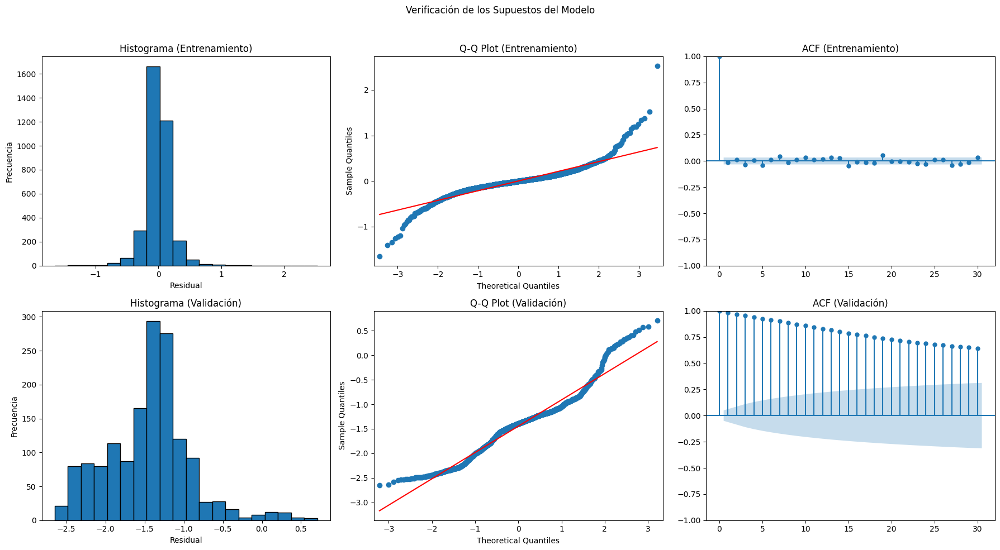

In [11]:

def evaluate_all_models(y_train, y_val, y_test):
    """Evalúa los tres tipos de suavización y selecciona el mejor modelo."""
    results = []

    # Evaluar Suavización Simple
    aic_simple, params_simple, model_simple = optimize_exponential_smoothing(
        y_train, y_val, y_test, 'Suavización Exponencial Simple')

    # Evaluar Suavización Doble
    aic_double, params_double, model_double = optimize_exponential_smoothing(
        y_train, y_val, y_test, 'Suavización Exponencial Doble', trend='add')

    # Evaluar Suavización Triple
    aic_triple, params_triple, model_triple = optimize_exponential_smoothing(
        y_train, y_val, y_test, 'Suavización Exponencial Triple', trend='add', seasonal='add', seasonal_periods=12)

    # Guardar resultados
    results.append(('Simple', aic_simple, model_simple))
    results.append(('Doble', aic_double, model_double))
    results.append(('Triple', aic_triple, model_triple))

    # Seleccionar el mejor modelo según el AIC más bajo
    best_model_name, best_aic, best_model = min(results, key=lambda x: x[1])
    print(f"El mejor modelo es: {best_model_name} con AIC={best_aic}")

    # Predicciones del mejor modelo
    y_train_pred = best_model.fittedvalues
    y_val_pred = best_model.forecast(steps=len(y_val))
    y_pred = best_model.forecast(steps=len(y_test) + len(y_val))[-len(y_test):]

    # Calcular métricas y generar gráficas solo para el mejor modelo
    calculate_and_store_metrics(best_model, best_model_name, y_train, y_train_pred, y_val, y_val_pred, y_test, y_pred)
    plot_model_results_plotly(y_train, y_train_pred, y_val, y_val_pred, y_test, y_pred, 
                              data.index, len(y_train), len(y_val), best_model_name)
    check_model_assumptions(best_model, y_train, y_train_pred, y_val, y_val_pred, y_test, y_pred)

# Ejemplo de uso
evaluate_all_models(y_train, y_val, y_test)


Los supuestos no se cumplieron este modelo no es valido. los residuales no son normales. no son independientes y no son aleatorios. esto se debe a que estos modelos no alcanzan a interpretar la complejidad de la serie por lo que no daran buenos resultados 

## Modelos Autoregresivos 

Al igual que con suavización exponencial se hizo una comparación entre los posibles parametros de los modelos autoregresivos para encontrar el mejor modelo comparnado la metrica AIC 

In [12]:
# Librerías comunes para todos los modelos
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
from sklearn.model_selection import GridSearchCV
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, SimpleRNN, LSTM, GRU, Conv1D, MaxPooling1D, Flatten
from sklearn.neural_network import MLPRegressor

import plotly.io as pio
import plotly.express as px
import plotly.offline as py
pio.renderers.default = "notebook"
import warnings
warnings.filterwarnings("ignore")

Implementamos el mismo modelo ARIMA al cual posteriormente le tartaremos los residuales para mejorar los resultados del modelo 

Evaluando: AR
Mejores parámetros: p=1, d=0, q=0 con AIC=-911.4617908954825
Evaluando: MA
Mejores parámetros: p=0, d=0, q=5 con AIC=3438.3500291627465
Evaluando: ARIMA
Mejores parámetros: p=2, d=1, q=5 con AIC=-923.2849978518195

El mejor modelo es: ARIMA con AIC=-923.2849978518195



----- Pruebas de Hipótesis sobre los Supuestos -----
Shapiro-Wilk p-value (Entrenamiento): 0.0000
Conclusión: NO sigue una distribución normal.

Ljung-Box p-value (Entrenamiento): 0.9600
Conclusión: Sin autocorrelación significativa.

Breusch-Pagan p-value (Entrenamiento): 0.0000
Conclusión: Varianza no constante.



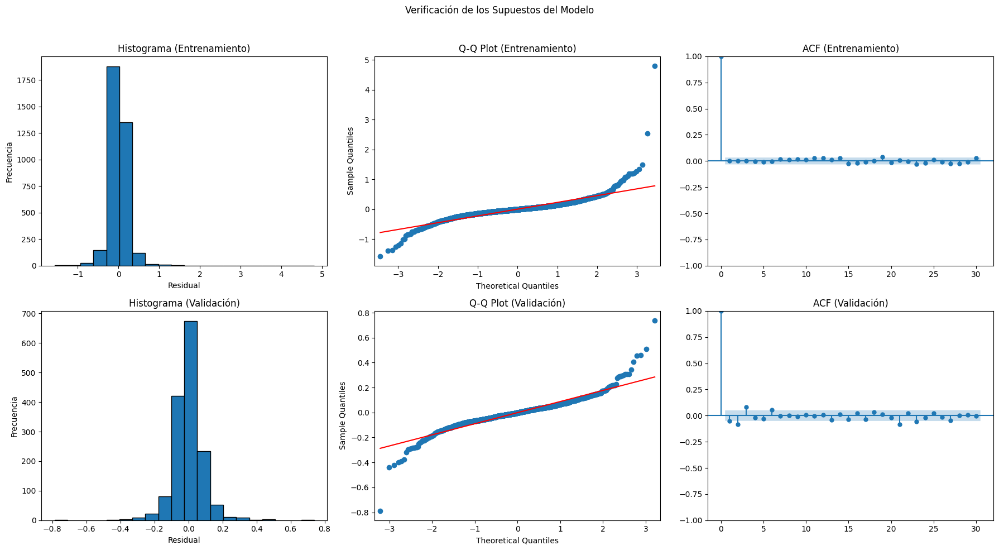

In [14]:
import numpy as np
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA

# Definir rangos de búsqueda para p, d y q
p_values = range(0, 3)
d_values = range(0, 2)
q_values = range(0, 6)

def rolling_forecast(order, y_train, y_val, y_test):
    
    history = list(y_train)  # Usar datos de entrenamiento como historial inicial
    val_predictions = []
    test_predictions = []

    # Predecir para el conjunto de validación
    for t in range(len(y_val)):
        model = ARIMA(history, order=order).fit()
        yhat = model.forecast()[0]
        val_predictions.append(yhat)
        history.append(y_val[t])  # Actualizar el historial con el dato real

    # Predecir para el conjunto de prueba
    for t in range(len(y_test)):
        model = ARIMA(history, order=order).fit()
        yhat = model.forecast()[0]
        test_predictions.append(yhat)
        history.append(y_test[t])  # Actualizar el historial con el dato real

    return np.array(val_predictions), np.array(test_predictions)

def optimize_model(order_range, y_train):
    """Optimiza el modelo ARIMA para los parámetros dados."""
    best_aic = float("inf")
    best_params = None
    best_model = None

    for p in order_range[0]:
        for d in order_range[1]:
            for q in order_range[2]:
                try:
                    model = ARIMA(y_train, order=(p, d, q)).fit()
                    aic = model.aic

                    if aic < best_aic:
                        best_aic = aic
                        best_params = (p, d, q)
                        best_model = model
                except Exception as e:
                    print(f"Error: {e}")
                    continue

    print(f"Mejores parámetros: p={best_params[0]}, d={best_params[1]}, q={best_params[2]} con AIC={best_aic}")
    return best_model, best_params

def evaluate_models(y_train, y_val, y_test, data):
    """Evalúa todos los modelos y selecciona el mejor."""
    models = [
        ('AR', (p_values, [0], [0])),
        ('MA', ([0], [0], q_values)),
        ('ARIMA', (p_values, d_values, q_values))
    ]

    best_aic = float("inf")
    best_model_name = None
    best_model = None
    best_params = None

    for model_name, order_range in models:
        print(f"Evaluando: {model_name}")
        model, params = optimize_model(order_range, y_train)

        if model.aic < best_aic:
            best_aic = model.aic
            best_model_name = model_name
            best_model = model
            best_params = params

    print(f"\nEl mejor modelo es: {best_model_name} con AIC={best_aic}")

    # Rolling forecast para validación y prueba
    y_val_pred, y_test_pred = rolling_forecast(best_params, y_train, y_val, y_test)
    y_train_pred = best_model.fittedvalues

    # Calcular y almacenar métricas
    calculate_and_store_metrics(best_model, best_model_name, y_train, y_train_pred, y_val, y_val_pred, y_test, y_test_pred)

    # Graficar los resultados
    plot_model_results_plotly(y_train, y_train_pred, y_val, y_val_pred, y_test, y_test_pred, data.index, len(y_train), len(y_val), best_model_name)

    # Verificar supuestos del mejor modelo
    check_model_assumptions(best_model, y_train, y_train_pred, y_val, y_val_pred, y_test, y_test_pred)

evaluate_models(y_train, y_val, y_test, data)


El modelo arima tuvo emjores resultados sin embargo, no cumple los supuestos,no distribuye normal, no tiene varianza constante y los residuos no son independientes. este modelo no es válido para hacer conclusiones

# RNN 
Se utlizó una grid search para encontrar los mejores parametros 

In [21]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense, Dropout
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt


In [22]:



# Dividir los datos en entrenamiento, validación y prueba
y_train_val, y_test = train_test_split(y, test_size=0.15, shuffle=False)
y_train, y_val = train_test_split(y_train_val, test_size=0.3, shuffle=False)

print(f'Tamaño de entrenamiento: {len(y_train)}')
print(f'Tamaño de validación: {len(y_val)}')
print(f'Tamaño de prueba: {len(y_test)}')


Tamaño de entrenamiento: 3558
Tamaño de validación: 1525
Tamaño de prueba: 897


In [23]:

# Función para crear el modelo RNN con hiperparámetros variables
def create_rnn(dropout_rate=0.2, neurons=10, n_layers=1):
    model = Sequential()
    # Añadir capas según el hiperparámetro n_layers
    for _ in range(n_layers):
        model.add(SimpleRNN(neurons, activation='tanh', return_sequences=True if n_layers > 1 else False,
                            input_shape=(1, 1)))
        model.add(Dropout(dropout_rate))
    model.add(Dense(1))  # Capa de salida
    model.compile(optimizer='adam', loss='mse')
    return model


In [24]:

# Grid Search con KerasRegressor
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor

model = KerasRegressor(build_fn=create_rnn, epochs=10, verbose=0)


In [25]:

# Parámetros para Grid Search extendido
param_grid = {
    'batch_size': [16, 32 ],
    'dropout_rate': [0.6, 0.8],
    'neurons': [50,100],
    'n_layers': [1], # Agregamos opción para una o dos capas
    'epochs': [10,20]
}


In [73]:
grid_result=0
history=0

In [69]:

# Configuración del GridSearch
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=3)
grid_result = grid.fit(y_train.reshape(-1, 1, 1), y_train)

# Mostrar los mejores parámetros
print(f'Mejor resultado: {grid_result.best_score_} con parámetros {grid_result.best_params_}')

# Crear y entrenar el mejor modelo
best_params = grid_result.best_params_
final_model = create_rnn(dropout_rate=best_params['dropout_rate'], 
                         neurons=best_params['neurons'],
                         n_layers=best_params['n_layers'])

history = final_model.fit(y_train.reshape(-1, 1, 1), y_train, 
                          validation_data=(y_val.reshape(-1, 1, 1), y_val), 
                          epochs=50, batch_size=best_params['batch_size'], verbose=1)

# Predicciones
y_train_pred_RNN = final_model.predict(y_train.reshape(-1, 1, 1))
y_val_pred_RNN = final_model.predict(y_val.reshape(-1, 1, 1))
y_test_pred_RNN = final_model.predict(y_test.reshape(-1, 1, 1))


Mejor resultado: -0.040075693589945637 con parámetros {'batch_size': 16, 'dropout_rate': 0.6, 'n_layers': 1, 'neurons': 200}
Epoch 1/50
223/223 [==============================] - 2s 5ms/step - loss: 2.8718 - val_loss: 0.0521
Epoch 2/50
223/223 [==============================] - 1s 4ms/step - loss: 0.7191 - val_loss: 0.0297
Epoch 3/50
223/223 [==============================] - 1s 4ms/step - loss: 0.4926 - val_loss: 0.1125
Epoch 4/50
223/223 [==============================] - 1s 4ms/step - loss: 0.3737 - val_loss: 0.0608
Epoch 5/50
223/223 [==============================] - 1s 4ms/step - loss: 0.3559 - val_loss: 0.0417
Epoch 6/50
223/223 [==============================] - 1s 4ms/step - loss: 0.3260 - val_loss: 0.0390
Epoch 7/50
223/223 [==============================] - 1s 4ms/step - loss: 0.2942 - val_loss: 0.0406
Epoch 8/50
223/223 [==============================] - 1s 4ms/step - loss: 0.2713 - val_loss: 0.0291
Epoch 9/50
223/223 [==============================] - 1s 4ms/step - loss: 0

In [71]:


calculate_and_store_metrics(
    model=final_model,
    model_name='RNN Mejor Modelo',
    y_train=y_train, y_train_pred =y_train_pred_RNN,
    y_val=y_val, y_val_pred=y_val_pred_RNN,
    y_test=y_test, y_pred =y_test_pred_RNN
)


----- Pruebas de Hipótesis sobre los Supuestos -----
Shapiro-Wilk p-value (Entrenamiento): 0.0000
Conclusión: NO sigue una distribución normal.

Ljung-Box p-value (Entrenamiento): 0.0000
Conclusión: Autocorrelación significativa.

Breusch-Pagan p-value (Entrenamiento): 0.0000
Conclusión: Varianza no constante.



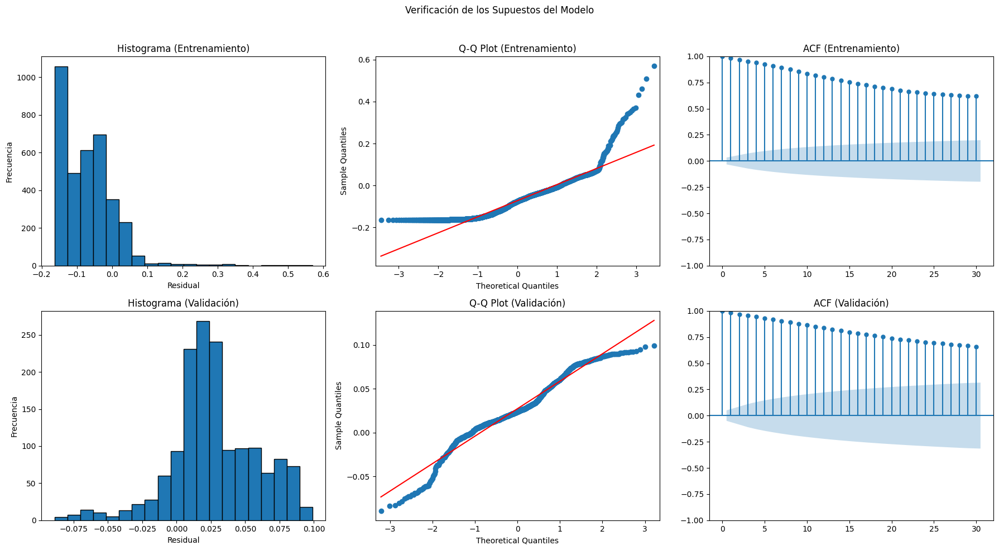

In [72]:

plot_model_results_plotly(y_train=y_train, 
                          y_train_pred=y_train_pred_RNN .reshape(-1), 
                          y_val=y_val, 
                          y_val_pred=y_val_pred_RNN .reshape(-1),
                          y_test=y_test,
                          y_pred=y_test_pred_RNN .reshape(-1),
                          data_index=data.index, train_size= len(y_train), 
                          val_size=len(y_val),title= 'RNN - Predicción del Precio de Cierre')

check_model_assumptions(
    model=final_model,
    y_train=y_train .reshape(-1), y_train_pred=y_train_pred_RNN .reshape(-1),
    y_val=y_val, y_val_pred=y_val_pred_RNN.reshape(-1),
    y_test=y_test, y_test_pred=y_test_pred_RNN 
)

{'batch_size': 16, 'dropout_rate': 0.6, 'epochs': 20, 'n_layers': 1, 'neurons': 100}
estos fueron los mejores parametros y aunque el error no es pronunciado los resiudos no cumplen con ninguno de los supuestos.

# LSTM

In [74]:

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.model_selection import train_test_split, GridSearchCV
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor
from math import sqrt


In [75]:

# Función para crear el modelo LSTM con hiperparámetros variables
def create_lstm(dropout_rate=0.3, neurons=10, n_layers=1):
    model = Sequential()
    for _ in range(n_layers):
        model.add(LSTM(neurons, activation='relu', 
                       return_sequences=True if n_layers > 1 else False, 
                       input_shape=(1, 1)))
        model.add(Dropout(dropout_rate))
    model.add(Dense(1))  # Capa de salida para regresión
    model.compile(optimizer='adam', loss='mse')
    return model


In [76]:

# Configurar el modelo con KerasRegressor para GridSearch
model = KerasRegressor(build_fn=create_lstm, epochs=10, verbose=0)
grid_result=0
history=0

In [77]:

# Parámetros para Grid Search extendido
param_grid = {
    'batch_size': [16, 64],
    'dropout_rate': [0.3, 0.6],
    'neurons': [20, 40],
    'n_layers': [1, 2]  # Opción para 1 o 2 capas
}


In [78]:

# Grid Search con validación cruzada
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=3)
grid_result = grid.fit(y_train.reshape(-1, 1, 1), y_train)

# Mostrar los mejores parámetros
print(f'Mejor resultado: {grid_result.best_score_} con parámetros {grid_result.best_params_}')

# Crear y entrenar el mejor modelo
best_params = grid_result.best_params_
final_model = create_lstm(
    dropout_rate=best_params['dropout_rate'],
    neurons=best_params['neurons'],
    n_layers=best_params['n_layers']
)

history = final_model.fit(
    y_train.reshape(-1, 1, 1), y_train, 
    validation_data=(y_val.reshape(-1, 1, 1), y_val), 
    epochs=50, batch_size=best_params['batch_size'], verbose=1
)

# Predicciones
y_train_pred_lstm= final_model.predict(y_train.reshape(-1, 1, 1))
y_val_pred_lstm = final_model.predict(y_val.reshape(-1, 1, 1))
y_test_pred_lstm = final_model.predict(y_test.reshape(-1, 1, 1))


Mejor resultado: -0.0235072560608387 con parámetros {'batch_size': 16, 'dropout_rate': 0.3, 'n_layers': 1, 'neurons': 40}
Epoch 1/50
223/223 [==============================] - 1s 3ms/step - loss: 9.5585 - val_loss: 0.3830
Epoch 2/50
223/223 [==============================] - 0s 2ms/step - loss: 1.4181 - val_loss: 0.1853
Epoch 3/50
223/223 [==============================] - 1s 3ms/step - loss: 1.2165 - val_loss: 0.0733
Epoch 4/50
223/223 [==============================] - 0s 2ms/step - loss: 0.9888 - val_loss: 0.0221
Epoch 5/50
223/223 [==============================] - 0s 2ms/step - loss: 0.9676 - val_loss: 0.0074
Epoch 6/50
223/223 [==============================] - 1s 2ms/step - loss: 0.9201 - val_loss: 0.0093
Epoch 7/50
223/223 [==============================] - 0s 2ms/step - loss: 0.8329 - val_loss: 0.0130
Epoch 8/50
223/223 [==============================] - 1s 2ms/step - loss: 0.8388 - val_loss: 0.0120
Epoch 9/50
223/223 [==============================] - 1s 3ms/step - loss: 0.84

In [79]:


calculate_and_store_metrics(
    model=final_model,
    model_name='LSTM',
    y_train=y_train,
    y_train_pred=y_train_pred_lstm,
    y_val=y_val,
    y_val_pred=y_val_pred_lstm,
    y_test=y_test,
    y_pred=y_test_pred_lstm
)


# Llamada a la función para graficar
plot_model_results_plotly(
    y_train=y_train, 
    y_train_pred=y_train_pred_lstm.reshape(-1), 
    y_val=y_val, 
    y_val_pred=y_val_pred_lstm.reshape(-1),
    y_test=y_test,
    y_pred=y_test_pred_lstm.reshape(-1),
    data_index=data.index, 
    train_size=len(y_train), 
    val_size=len(y_val), 
    title='LSTM - Predicción del Precio de Cierre'
)



----- Pruebas de Hipótesis sobre los Supuestos -----
Shapiro-Wilk p-value (Entrenamiento): 0.0000
Conclusión: NO sigue una distribución normal.

Ljung-Box p-value (Entrenamiento): 0.0000
Conclusión: Autocorrelación significativa.

Breusch-Pagan p-value (Entrenamiento): 0.0099
Conclusión: Varianza no constante.



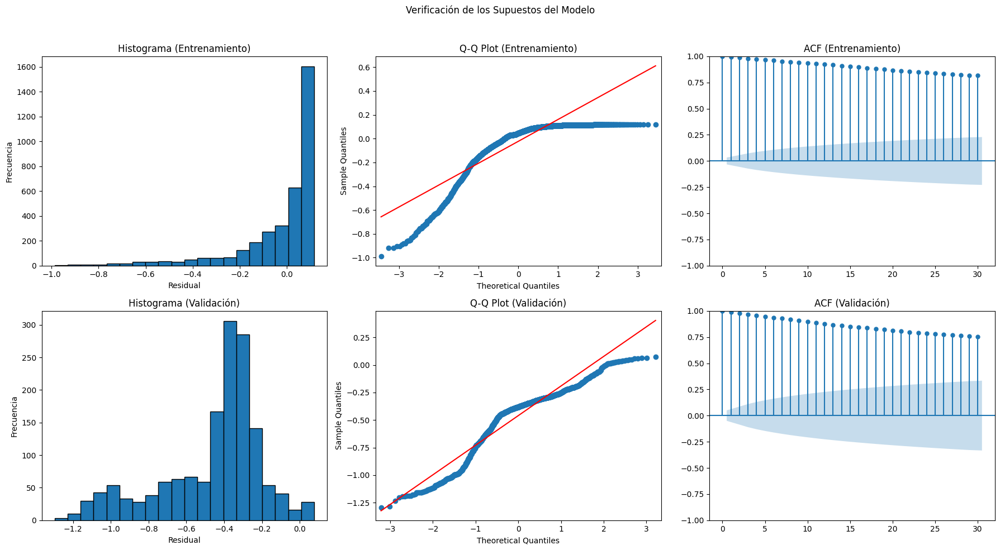

In [81]:
check_model_assumptions(
    model=final_model,
    y_train=y_train.reshape(-1), y_train_pred=y_train_pred_lstm.reshape(-1),
    y_val=y_val, y_val_pred=y_val_pred_lstm.reshape(-1),
    y_test=y_test, y_test_pred=y_test_pred_lstm
)

EL modelo no cumple

# Redes Neuronales modelo MLp



In [83]:


# Función para crear el modelo MLP con hiperparámetros variables
def create_mlp(dropout_rate=0.8, neurons=10, n_layers=1):
    model = Sequential()
    for _ in range(n_layers):
        model.add(Dense(neurons, activation='relu', input_shape=(1,)))
        model.add(Dropout(dropout_rate))
    model.add(Dense(1))  # Capa de salida para regresión
    model.compile(optimizer='adam', loss='mse')
    return model


In [82]:
history=[]
grid=None
grid_result=0
best_params=0
model=0

In [84]:

# Configuración del modelo con KerasRegressor para GridSearch
model = KerasRegressor(build_fn=create_mlp, epochs=10, verbose=0)


In [85]:

# Parámetros para Grid Search extendido
param_grid = {
    'batch_size': [16, 64],
    'dropout_rate': [0.6, 0.8],
    'neurons': [100,200],
    'n_layers': [1]  
}

# Grid Search con validación cruzada
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=3)
grid_result = grid.fit(y_train.reshape(-1, 1), y_train)

# Mostrar los mejores parámetros
print(f'Mejor resultado: {grid_result.best_score_} con parámetros {grid_result.best_params_}')

# Crear y entrenar el mejor modelo
best_params = grid_result.best_params_
final_model = create_mlp(
    dropout_rate=best_params['dropout_rate'],
    neurons=best_params['neurons'],
    n_layers=best_params['n_layers']
)

history = final_model.fit(
    y_train.reshape(-1, 1), y_train, 
    validation_data=(y_val.reshape(-1, 1), y_val), 
    epochs=50, batch_size=best_params['batch_size'], verbose=1
)

# Predicciones
y_train_pred_mlp = final_model.predict(y_train.reshape(-1, 1))
y_val_pred_mlp = final_model.predict(y_val.reshape(-1, 1))
y_test_pred_mlp = final_model.predict(y_test.reshape(-1, 1))


Mejor resultado: -0.005639246199280024 con parámetros {'batch_size': 16, 'dropout_rate': 0.6, 'n_layers': 1, 'neurons': 200}
Epoch 1/50
223/223 [==============================] - 1s 4ms/step - loss: 3.0600 - val_loss: 0.0168
Epoch 2/50
223/223 [==============================] - 0s 2ms/step - loss: 1.0338 - val_loss: 0.0024
Epoch 3/50
223/223 [==============================] - 0s 2ms/step - loss: 0.9176 - val_loss: 0.0061
Epoch 4/50
223/223 [==============================] - 0s 2ms/step - loss: 0.8072 - val_loss: 0.0029
Epoch 5/50
223/223 [==============================] - 0s 2ms/step - loss: 0.7688 - val_loss: 3.5412e-04
Epoch 6/50
223/223 [==============================] - 0s 2ms/step - loss: 0.7143 - val_loss: 0.0032
Epoch 7/50
223/223 [==============================] - 0s 1ms/step - loss: 0.6643 - val_loss: 0.0020
Epoch 8/50
223/223 [==============================] - 0s 2ms/step - loss: 0.6495 - val_loss: 9.2519e-04
Epoch 9/50
223/223 [==============================] - 0s 2ms/step -


----- Pruebas de Hipótesis sobre los Supuestos -----
Shapiro-Wilk p-value (Entrenamiento): 0.0000
Conclusión: NO sigue una distribución normal.

Ljung-Box p-value (Entrenamiento): 0.0000
Conclusión: Autocorrelación significativa.

Breusch-Pagan p-value (Entrenamiento): 0.0000
Conclusión: Varianza no constante.



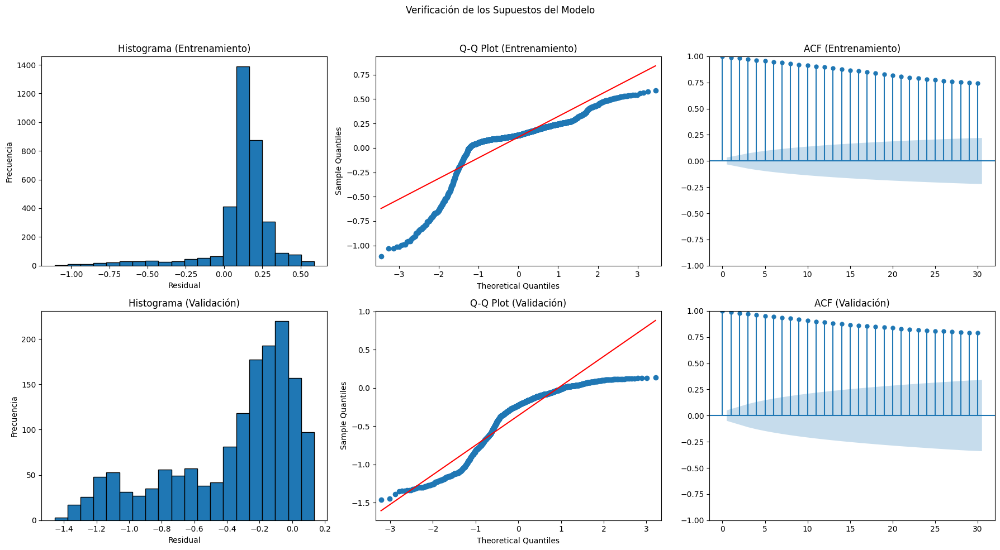

In [86]:



calculate_and_store_metrics(
    model=final_model,
    model_name='MLP Mejor Modelo',
    y_train=y_train, y_train_pred=y_train_pred_mlp,
    y_val=y_val, y_val_pred=y_val_pred_mlp,
    y_test=y_test, y_pred=y_test_pred_mlp
)



plot_model_results_plotly(
    y_train=y_train, 
    y_train_pred=y_train_pred_mlp.reshape(-1), 
    y_val=y_val, 
    y_val_pred=y_val_pred_mlp.reshape(-1),
    y_test=y_test, 
    y_pred=y_test_pred_mlp.reshape(-1),
    data_index=data.index, 
    train_size=len(y_train), 
    val_size=len(y_val), 
    title='MLP - Predicción del Precio de Cierre'
)

# Verificar los residuales con la función proporcionada
check_model_assumptions(
    model=final_model,
    y_train=y_train.reshape(-1), y_train_pred=y_train_pred_mlp.reshape(-1),
    y_val=y_val, y_val_pred=y_val_pred_mlp.reshape(-1),
    y_test=y_test, y_test_pred=y_test_pred_mlp
)


El modelo no cumple con ninguno de los supuesto por lo que no es un modelo apto.

In [ ]:
tabla = pd.DataFrame(metrics_list)


In [60]:
tabla

,Modelo,MAPE Prueba,RMSE Prueba,MAPE Validación,RMSE Validación
0,Simple,0.485024,1.974356,0.606790,1.542241
1,ARIMA,0.035799,0.238105,0.022694,0.089031
2,RNN Mejor Modelo,0.026424,0.081393,0.040286,0.101594
3,LSTM,0.171961,0.558127,0.251937,0.670283
4,MLP Mejor Modelo,0.107638,0.396454,0.164215,0.503184
